In [1]:
# add root dir to syspath
import os,sys,inspect
current_dir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parent_dir = os.path.dirname(current_dir)
root_dir = os.path.dirname(parent_dir)
sys.path.insert(0, root_dir)

In [2]:
from imageGenerators import load_realdata
from munit import Munit
from imageGenerators.imgGen_augmented import synth_generator as synth_generator_new

import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [3]:
# assert model is running on gpu
from tensorflow.python.client import device_lib
devlist = str(device_lib.list_local_devices())
assert "GPU:0" in devlist

In [4]:
#dims = (512, 128) # w,h
#dims = (256, 64) # w,h
#dims = (128, 32) # w,h
#dims = (400, 100)
dims = (128, 128)
smallModel=True
channels = 1

image_shape = (dims[1], dims[0], channels) # h,w,c

n_images = 128
n_test = 5
epochs = 10

batch_size = 1

CHECKPOINTPATH = Path("D:/m2/savedmodels/munit/dev_128_128_smallModels")
CHECKPOINTPATH.mkdir()

In [5]:
####
# Input: imageArray [n, h, w, c]; dtype float32; values [0,255]
# normalizes Input inplace to [-1,1]
def normalize_images(images):
    assert images.dtype == "float32"
    result = (images / 127.5) - 1    
    images[...] = result
    
def showImage(image, title=None):
    assert len(image.shape) == 3 and image.dtype == "float32"
    if not title is None:
        print(title)
    plt.imshow(image[...,0], cmap="gray", vmin=-1, vmax=1)
    plt.show()

def showImages(images, n_to_show=None, title=None):
    assert len(images.shape) == 4 and images.dtype == "float32"
    n_to_show = len(images) if n_to_show is None else n_to_show
    n_to_show = min(n_to_show, len(images))
    
    if not title is None:
        print(title)
    
    for i in range(n_to_show):
        plt.imshow(images[i,...,0], cmap="gray", vmin=-1, vmax=1)
        plt.show()

C:\Users\andre\jupyter_ws\imageGenerators\load_realdata.py:62: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  df = pd.read_csv(txt_path, sep=seperators ,header=None)


real easy images


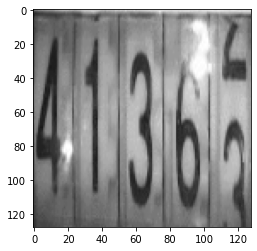

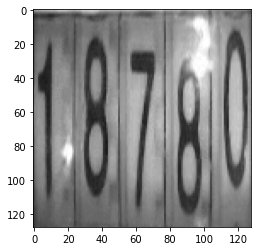

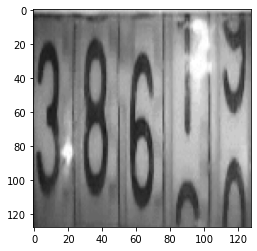

In [6]:
# load real easy images
images_real, labels_real = load_realdata.load_wmr_easy(n_toLoad = n_images, resizeTo=dims, keepRatio=False, processImage=None, channels=channels)
images_real = images_real.astype(("float32"))
normalize_images(images_real)
showImages(images_real, n_to_show=3, title="real easy images")

# testimages
images_real_test, labels_real_test = load_realdata.load_wmr_easy(n_toLoad = n_test, resizeTo=dims, keepRatio=False, processImage=None, channels=channels)
images_real_test = images_real_test.astype(("float32"))
normalize_images(images_real_test)

synthethic easy images


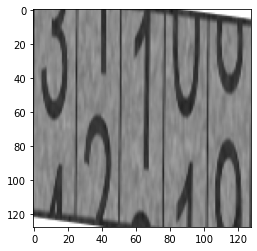

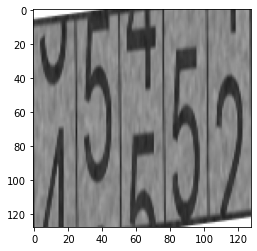

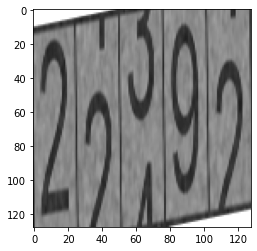

In [7]:
# generate synthethic images
synthGenerator = synth_generator_new()
labels_synth_train = np.random.randint(0,20, (n_images, 5) )
images_synth_train = synthGenerator.makeImages(labels_synth_train, resizeTo=dims, channels=channels, color=True, rotate=True)
images_synth_train = images_synth_train.astype(("float32"))
normalize_images(images_synth_train)
showImages(images_synth_train, n_to_show=3, title="synthethic easy images")

synthethic easy images


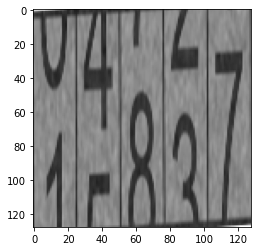

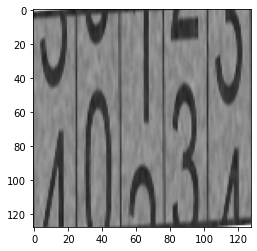

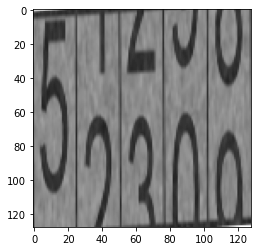

In [8]:
# generate synthethic test images
labels_synth_test = np.random.randint(0,20, (5, 5) )
images_synth_test = synthGenerator.makeImages(labels_synth_test, resizeTo=dims, channels=channels, color=True, rotate=True)
images_synth_test = images_synth_test.astype(("float32"))
normalize_images(images_synth_test)
showImages(images_synth_test, n_to_show=3, title="synthethic easy images")

In [9]:
# make datasets
def dataset(data):
    return tf.data.Dataset.from_tensor_slices(data)\
            .cache()\
            .batch(batch_size)

train_A = dataset(images_real)
train_B = dataset(images_synth_train)

test_A = images_synth_test
test_B = images_real_test

In [10]:
# load munit
model = Munit(image_shape, CHECKPOINTPATH, smallModel=smallModel)

!!! ------------------------
layer-normalization not implemented yet. for now, not using any normalization on upscaling layers. Implement later and compare results
!!! ------------------------
!!! ------------------------
layer-normalization not implemented yet. for now, not using any normalization on upscaling layers. Implement later and compare results
!!! ------------------------
!!! ------------------------
layer-normalization not implemented yet. for now, not using any normalization on upscaling layers. Implement later and compare results
!!! ------------------------
!!! ------------------------
layer-normalization not implemented yet. for now, not using any normalization on upscaling layers. Implement later and compare results
!!! ------------------------
created new Model


epoch 1:
step 0 took 45.86 seconds
step 1 took 0.29 seconds
step 2 took 0.41 seconds
step 3 took 0.38 seconds
step 4 took 0.42 seconds
step 5 took 0.39 seconds
step 6 took 0.41 seconds
step 7 took 0.40 seconds
step 8 took 0.38 seconds
step 9 took 0.40 seconds
step 10 took 0.41 seconds
step 11 took 0.39 seconds
step 12 took 0.41 seconds
step 13 took 0.38 seconds
step 14 took 0.41 seconds
step 15 took 0.40 seconds
step 16 took 0.40 seconds
step 17 took 0.39 seconds
step 18 took 0.41 seconds
step 19 took 0.40 seconds
step 20 took 0.40 seconds
step 21 took 0.39 seconds
step 22 took 0.41 seconds
step 23 took 0.39 seconds
step 24 took 0.41 seconds
step 25 took 0.40 seconds
step 26 took 0.40 seconds
step 27 took 0.40 seconds
step 28 took 0.39 seconds
step 29 took 0.39 seconds
step 30 took 0.40 seconds
step 31 took 0.40 seconds
step 32 took 0.38 seconds
step 33 took 0.40 seconds
step 34 took 0.39 seconds
step 35 took 0.42 seconds
step 36 took 0.40 seconds
step 37 took 0.39 seconds
step 38 took

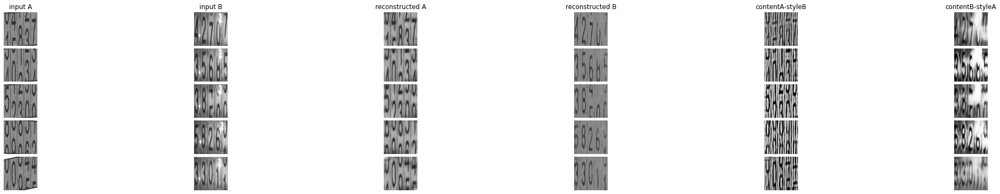

wrote logs: 0.08 seconds


<Figure size 432x288 with 0 Axes>

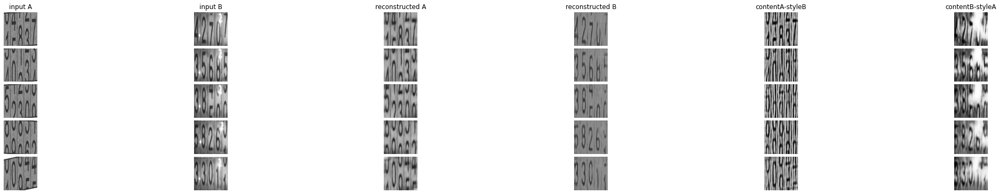

<Figure size 432x288 with 0 Axes>

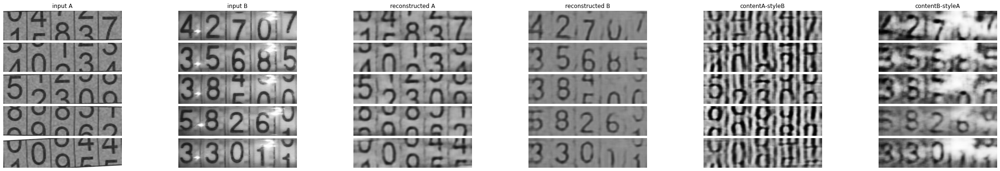

epoch 2:
step 0 took 0.50 seconds
step 1 took 0.41 seconds
step 2 took 0.41 seconds
step 3 took 0.40 seconds
step 4 took 0.40 seconds
step 5 took 0.40 seconds
step 6 took 0.38 seconds
step 7 took 0.41 seconds
step 8 took 0.39 seconds
step 9 took 0.41 seconds
step 10 took 0.39 seconds
step 11 took 0.39 seconds
step 12 took 0.42 seconds
step 13 took 0.39 seconds
step 14 took 0.39 seconds
step 15 took 0.39 seconds
step 16 took 0.40 seconds
step 17 took 0.40 seconds
step 18 took 0.41 seconds
step 19 took 0.41 seconds
step 20 took 0.39 seconds
step 21 took 0.39 seconds
step 22 took 0.41 seconds
step 23 took 0.39 seconds
step 24 took 0.40 seconds
step 25 took 0.40 seconds
step 26 took 0.39 seconds
step 27 took 0.40 seconds
step 28 took 0.38 seconds
step 29 took 0.40 seconds
step 30 took 0.40 seconds
step 31 took 0.40 seconds
step 32 took 0.40 seconds
step 33 took 0.39 seconds
step 34 took 0.40 seconds
step 35 took 0.42 seconds
step 36 took 0.40 seconds
step 37 took 0.40 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

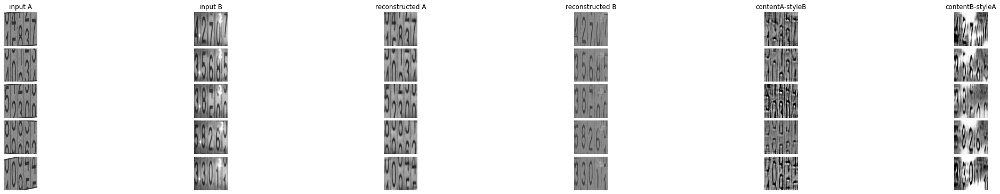

wrote logs: 0.08 seconds


<Figure size 432x288 with 0 Axes>

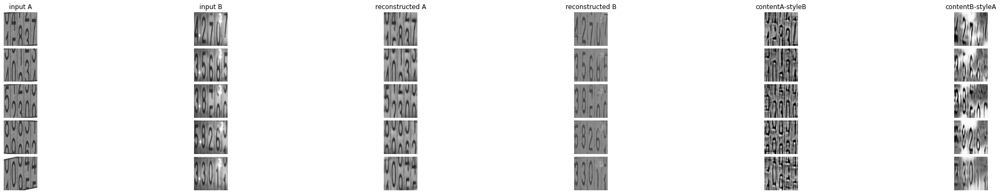

<Figure size 432x288 with 0 Axes>

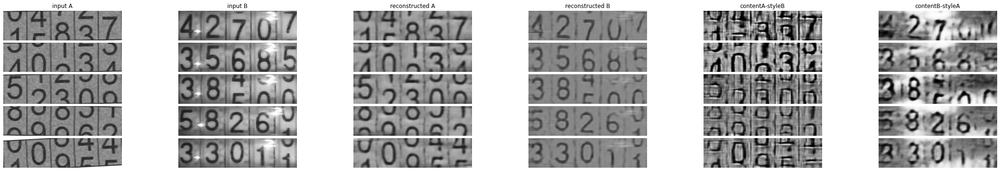

epoch 3:
step 0 took 0.50 seconds
step 1 took 0.41 seconds
step 2 took 0.40 seconds
step 3 took 0.40 seconds
step 4 took 0.40 seconds
step 5 took 0.38 seconds
step 6 took 0.42 seconds
step 7 took 0.40 seconds
step 8 took 0.39 seconds
step 9 took 0.40 seconds
step 10 took 0.39 seconds
step 11 took 0.41 seconds
step 12 took 0.40 seconds
step 13 took 0.40 seconds
step 14 took 0.38 seconds
step 15 took 0.41 seconds
step 16 took 0.40 seconds
step 17 took 0.40 seconds
step 18 took 0.39 seconds
step 19 took 0.41 seconds
step 20 took 0.39 seconds
step 21 took 0.40 seconds
step 22 took 0.41 seconds
step 23 took 0.40 seconds
step 24 took 0.39 seconds
step 25 took 0.40 seconds
step 26 took 0.40 seconds
step 27 took 0.40 seconds
step 28 took 0.40 seconds
step 29 took 0.40 seconds
step 30 took 0.40 seconds
step 31 took 0.40 seconds
step 32 took 0.39 seconds
step 33 took 0.42 seconds
step 34 took 0.39 seconds
step 35 took 0.40 seconds
step 36 took 0.39 seconds
step 37 took 0.41 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

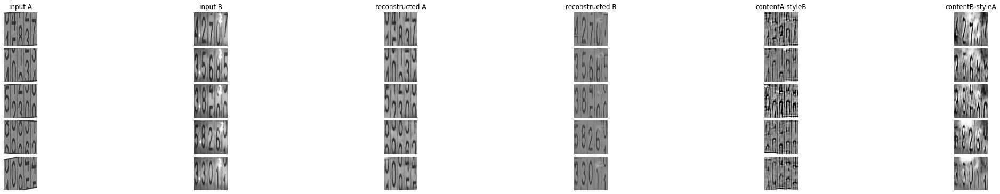

wrote logs: 0.07 seconds


<Figure size 432x288 with 0 Axes>

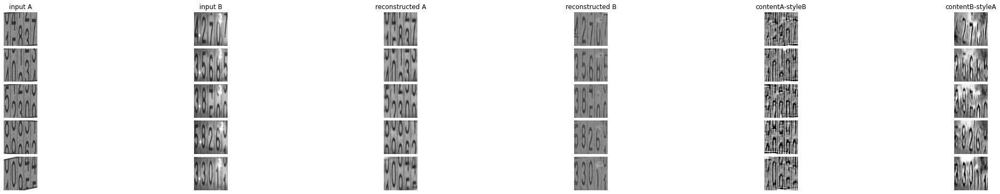

<Figure size 432x288 with 0 Axes>

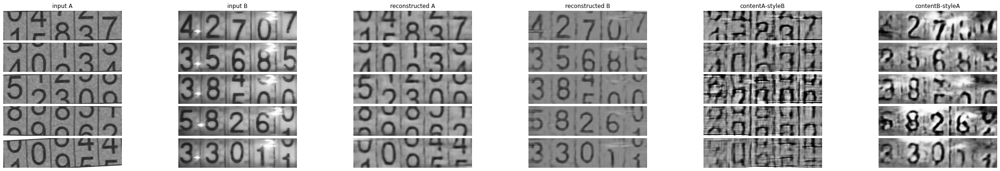

epoch 4:
step 0 took 0.50 seconds
step 1 took 0.41 seconds
step 2 took 0.40 seconds
step 3 took 0.40 seconds
step 4 took 0.40 seconds
step 5 took 0.40 seconds
step 6 took 0.39 seconds
step 7 took 0.40 seconds
step 8 took 0.41 seconds
step 9 took 0.40 seconds
step 10 took 0.38 seconds
step 11 took 0.41 seconds
step 12 took 0.40 seconds
step 13 took 0.40 seconds
step 14 took 0.41 seconds
step 15 took 0.39 seconds
step 16 took 0.40 seconds
step 17 took 0.40 seconds
step 18 took 0.41 seconds
step 19 took 0.40 seconds
step 20 took 0.40 seconds
step 21 took 0.39 seconds
step 22 took 0.39 seconds
step 23 took 0.41 seconds
step 24 took 0.40 seconds
step 25 took 0.40 seconds
step 26 took 0.39 seconds
step 27 took 0.39 seconds
step 28 took 0.40 seconds
step 29 took 0.40 seconds
step 30 took 0.38 seconds
step 31 took 0.42 seconds
step 32 took 0.38 seconds
step 33 took 0.41 seconds
step 34 took 0.39 seconds
step 35 took 0.41 seconds
step 36 took 0.39 seconds
step 37 took 0.41 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

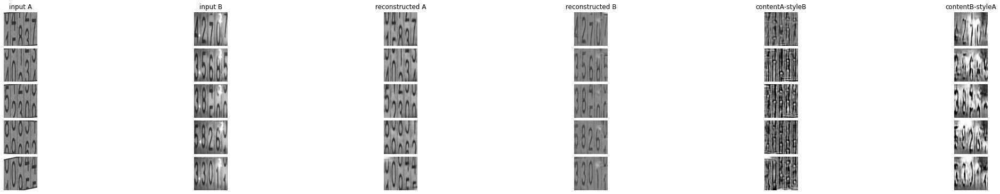

wrote logs: 0.08 seconds


<Figure size 432x288 with 0 Axes>

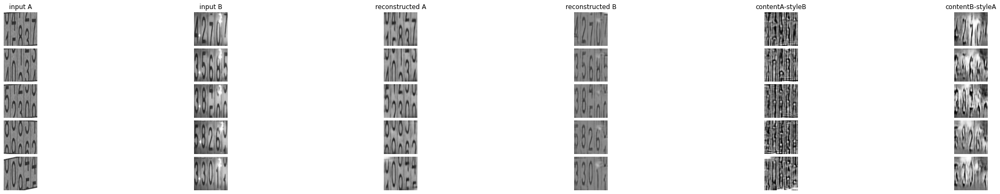

<Figure size 432x288 with 0 Axes>

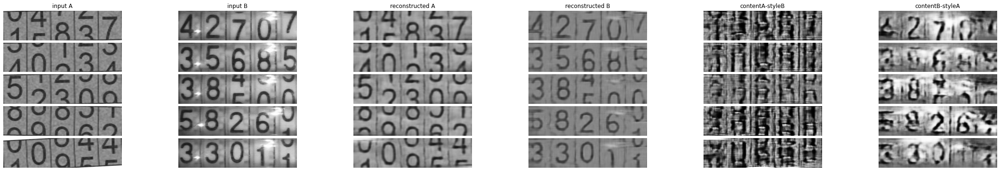

epoch 5:
step 0 took 0.50 seconds
step 1 took 0.41 seconds
step 2 took 0.40 seconds
step 3 took 0.40 seconds
step 4 took 0.40 seconds
step 5 took 0.40 seconds
step 6 took 0.39 seconds
step 7 took 0.40 seconds
step 8 took 0.40 seconds
step 9 took 0.39 seconds
step 10 took 0.39 seconds
step 11 took 0.40 seconds
step 12 took 0.41 seconds
step 13 took 0.40 seconds
step 14 took 0.41 seconds
step 15 took 0.39 seconds
step 16 took 0.38 seconds
step 17 took 0.41 seconds
step 18 took 0.40 seconds
step 19 took 0.40 seconds
step 20 took 0.39 seconds
step 21 took 0.41 seconds
step 22 took 0.39 seconds
step 23 took 0.40 seconds
step 24 took 0.40 seconds
step 25 took 0.40 seconds
step 26 took 0.40 seconds
step 27 took 0.40 seconds
step 28 took 0.39 seconds
step 29 took 0.40 seconds
step 30 took 0.41 seconds
step 31 took 0.40 seconds
step 32 took 0.40 seconds
step 33 took 0.40 seconds
step 34 took 0.39 seconds
step 35 took 0.39 seconds
step 36 took 0.41 seconds
step 37 took 0.39 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

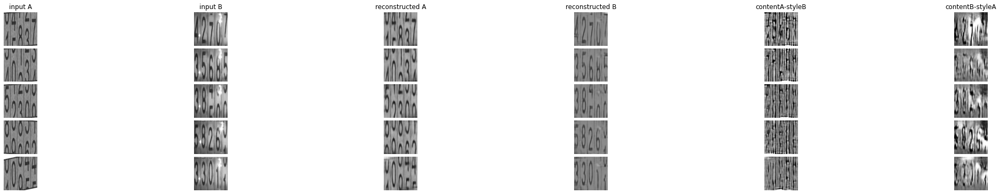

wrote logs: 0.05 seconds


<Figure size 432x288 with 0 Axes>

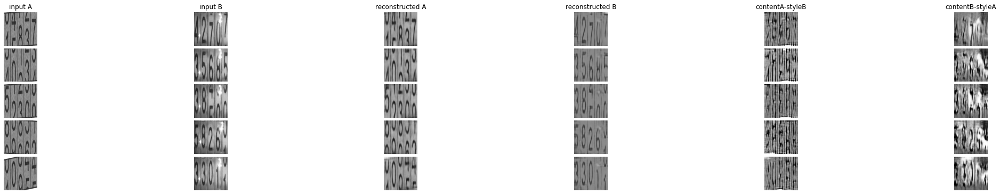

<Figure size 432x288 with 0 Axes>

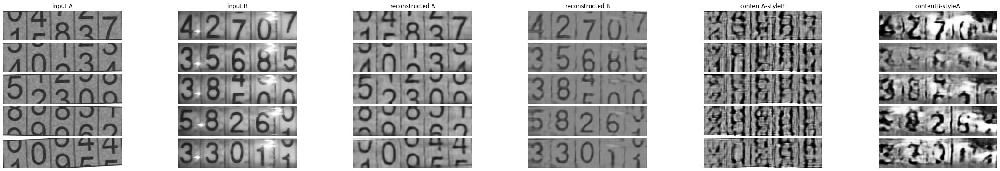

epoch 6:
step 0 took 0.50 seconds
step 1 took 0.42 seconds
step 2 took 0.40 seconds
step 3 took 0.38 seconds
step 4 took 0.41 seconds
step 5 took 0.40 seconds
step 6 took 0.40 seconds
step 7 took 0.40 seconds
step 8 took 0.42 seconds
step 9 took 0.38 seconds
step 10 took 0.42 seconds
step 11 took 0.38 seconds
step 12 took 0.42 seconds
step 13 took 0.39 seconds
step 14 took 0.40 seconds
step 15 took 0.42 seconds
step 16 took 0.38 seconds
step 17 took 0.42 seconds
step 18 took 0.40 seconds
step 19 took 0.39 seconds
step 20 took 0.40 seconds
step 21 took 0.39 seconds
step 22 took 0.42 seconds
step 23 took 0.41 seconds
step 24 took 0.40 seconds
step 25 took 0.38 seconds
step 26 took 0.41 seconds
step 27 took 0.39 seconds
step 28 took 0.40 seconds
step 29 took 0.41 seconds
step 30 took 0.40 seconds
step 31 took 0.39 seconds
step 32 took 0.41 seconds
step 33 took 0.39 seconds
step 34 took 0.42 seconds
step 35 took 0.40 seconds
step 36 took 0.40 seconds
step 37 took 0.39 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

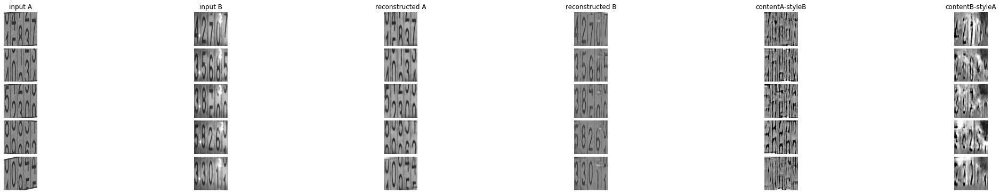

wrote logs: 0.09 seconds


<Figure size 432x288 with 0 Axes>

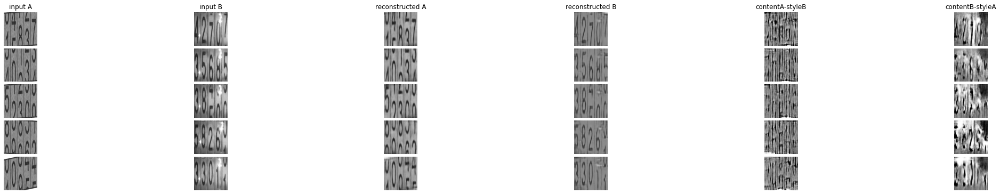

<Figure size 432x288 with 0 Axes>

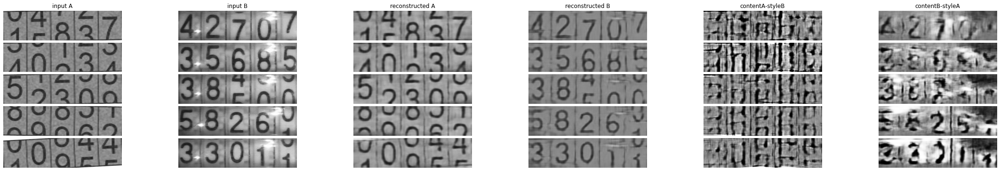

epoch 7:
step 0 took 0.50 seconds
step 1 took 0.41 seconds
step 2 took 0.40 seconds
step 3 took 0.40 seconds
step 4 took 0.40 seconds
step 5 took 0.40 seconds
step 6 took 0.40 seconds
step 7 took 0.40 seconds
step 8 took 0.39 seconds
step 9 took 0.41 seconds
step 10 took 0.39 seconds
step 11 took 0.40 seconds
step 12 took 0.39 seconds
step 13 took 0.40 seconds
step 14 took 0.41 seconds
step 15 took 0.40 seconds
step 16 took 0.41 seconds
step 17 took 0.40 seconds
step 18 took 0.40 seconds
step 19 took 0.39 seconds
step 20 took 0.40 seconds
step 21 took 0.42 seconds
step 22 took 0.39 seconds
step 23 took 0.42 seconds
step 24 took 0.39 seconds
step 25 took 0.40 seconds
step 26 took 0.40 seconds
step 27 took 0.41 seconds
step 28 took 0.40 seconds
step 29 took 0.40 seconds
step 30 took 0.40 seconds
step 31 took 0.40 seconds
step 32 took 0.40 seconds
step 33 took 0.41 seconds
step 34 took 0.40 seconds
step 35 took 0.39 seconds
step 36 took 0.39 seconds
step 37 took 0.41 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

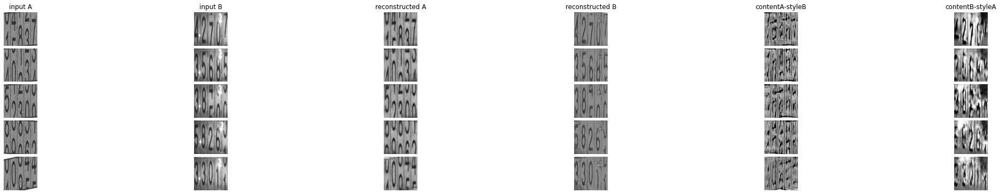

wrote logs: 0.06 seconds


<Figure size 432x288 with 0 Axes>

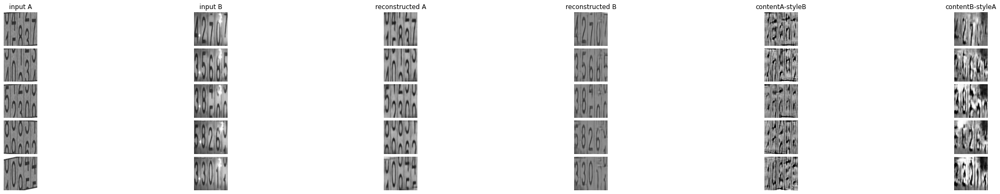

<Figure size 432x288 with 0 Axes>

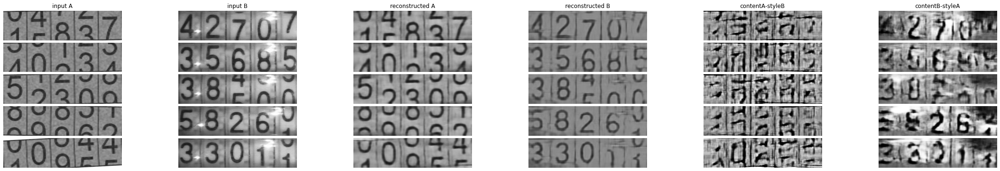

epoch 8:
step 0 took 0.52 seconds
step 1 took 0.39 seconds
step 2 took 0.41 seconds
step 3 took 0.40 seconds
step 4 took 0.39 seconds
step 5 took 0.39 seconds
step 6 took 0.41 seconds
step 7 took 0.41 seconds
step 8 took 0.40 seconds
step 9 took 0.40 seconds
step 10 took 0.40 seconds
step 11 took 0.38 seconds
step 12 took 0.42 seconds
step 13 took 0.41 seconds
step 14 took 0.39 seconds
step 15 took 0.39 seconds
step 16 took 0.41 seconds
step 17 took 0.40 seconds
step 18 took 0.40 seconds
step 19 took 0.41 seconds
step 20 took 0.39 seconds
step 21 took 0.40 seconds
step 22 took 0.39 seconds
step 23 took 0.40 seconds
step 24 took 0.43 seconds
step 25 took 0.40 seconds
step 26 took 0.40 seconds
step 27 took 0.39 seconds
step 28 took 0.41 seconds
step 29 took 0.42 seconds
step 30 took 0.39 seconds
step 31 took 0.39 seconds
step 32 took 0.40 seconds
step 33 took 0.42 seconds
step 34 took 0.39 seconds
step 35 took 0.41 seconds
step 36 took 0.40 seconds
step 37 took 0.38 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

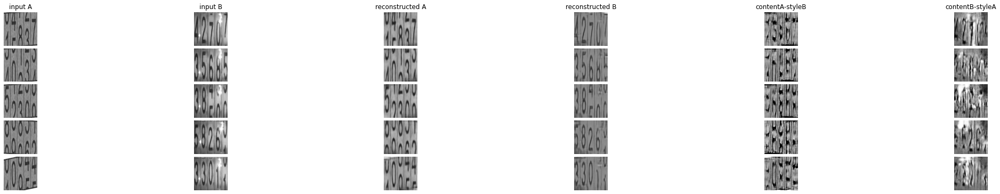

wrote logs: 0.08 seconds


<Figure size 432x288 with 0 Axes>

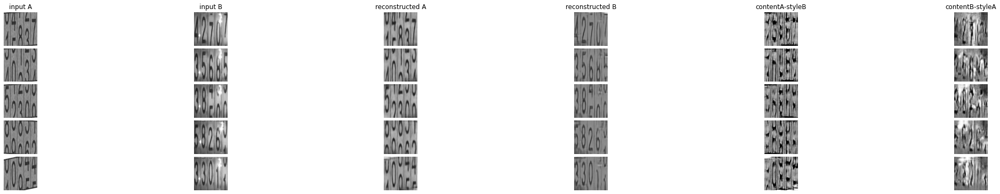

<Figure size 432x288 with 0 Axes>

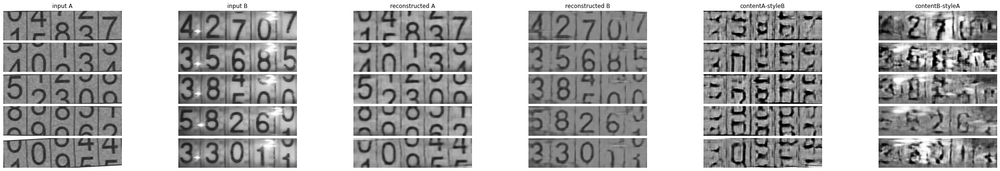

epoch 9:
step 0 took 0.51 seconds
step 1 took 0.41 seconds
step 2 took 0.40 seconds
step 3 took 0.40 seconds
step 4 took 0.41 seconds
step 5 took 0.40 seconds
step 6 took 0.39 seconds
step 7 took 0.39 seconds
step 8 took 0.41 seconds
step 9 took 0.39 seconds
step 10 took 0.40 seconds
step 11 took 0.41 seconds
step 12 took 0.38 seconds
step 13 took 0.42 seconds
step 14 took 0.39 seconds
step 15 took 0.39 seconds
step 16 took 0.41 seconds
step 17 took 0.40 seconds
step 18 took 0.41 seconds
step 19 took 0.40 seconds
step 20 took 0.40 seconds
step 21 took 0.39 seconds
step 22 took 0.42 seconds
step 23 took 0.39 seconds
step 24 took 0.41 seconds
step 25 took 0.41 seconds
step 26 took 0.39 seconds
step 27 took 0.41 seconds
step 28 took 0.40 seconds
step 29 took 0.41 seconds
step 30 took 0.40 seconds
step 31 took 0.41 seconds
step 32 took 0.39 seconds
step 33 took 0.40 seconds
step 34 took 0.40 seconds
step 35 took 0.41 seconds
step 36 took 0.41 seconds
step 37 took 0.39 seconds
step 38 took 

<Figure size 432x288 with 0 Axes>

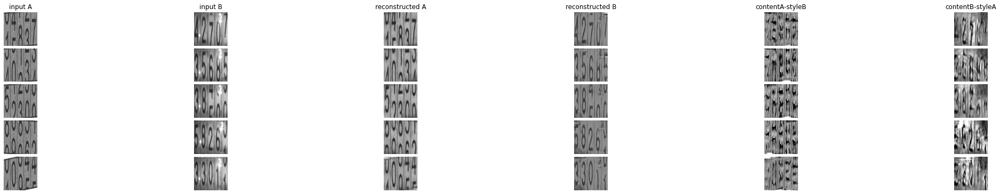

wrote logs: 0.07 seconds


<Figure size 432x288 with 0 Axes>

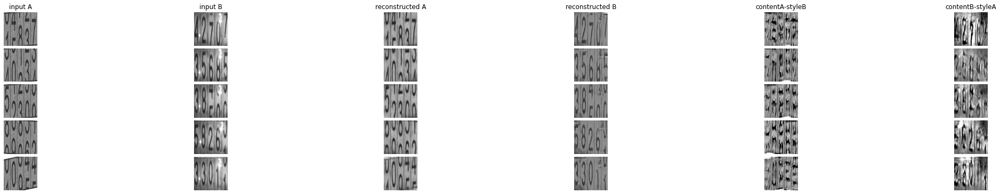

<Figure size 432x288 with 0 Axes>

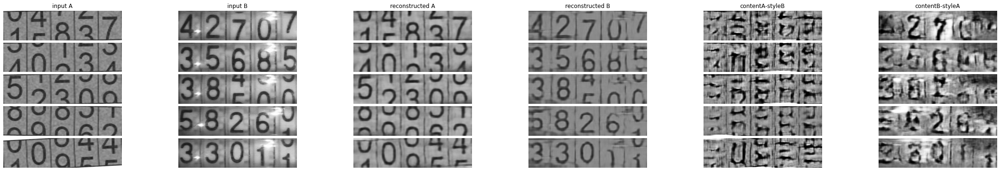

epoch 10:
step 0 took 0.50 seconds
step 1 took 0.42 seconds
step 2 took 0.38 seconds
step 3 took 0.41 seconds
step 4 took 0.40 seconds
step 5 took 0.39 seconds
step 6 took 0.40 seconds
step 7 took 0.43 seconds
step 8 took 0.39 seconds
step 9 took 0.41 seconds
step 10 took 0.39 seconds
step 11 took 0.41 seconds
step 12 took 0.40 seconds
step 13 took 0.40 seconds
step 14 took 0.40 seconds
step 15 took 0.40 seconds
step 16 took 0.40 seconds
step 17 took 0.39 seconds
step 18 took 0.41 seconds
step 19 took 0.40 seconds
step 20 took 0.40 seconds
step 21 took 0.40 seconds
step 22 took 0.41 seconds
step 23 took 0.40 seconds
step 24 took 0.40 seconds
step 25 took 0.39 seconds
step 26 took 0.41 seconds
step 27 took 0.39 seconds
step 28 took 0.42 seconds
step 29 took 0.39 seconds
step 30 took 0.39 seconds
step 31 took 0.40 seconds
step 32 took 0.40 seconds
step 33 took 0.41 seconds
step 34 took 0.40 seconds
step 35 took 0.41 seconds
step 36 took 0.40 seconds
step 37 took 0.40 seconds
step 38 took

<Figure size 432x288 with 0 Axes>

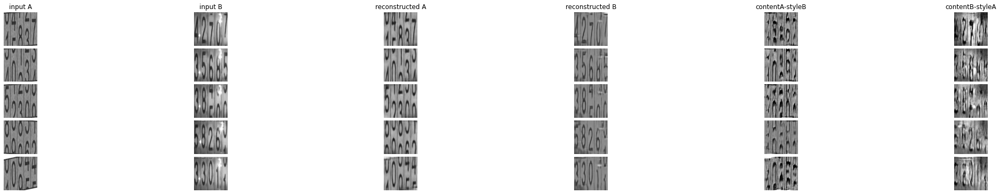

wrote logs: 0.06 seconds


<Figure size 432x288 with 0 Axes>

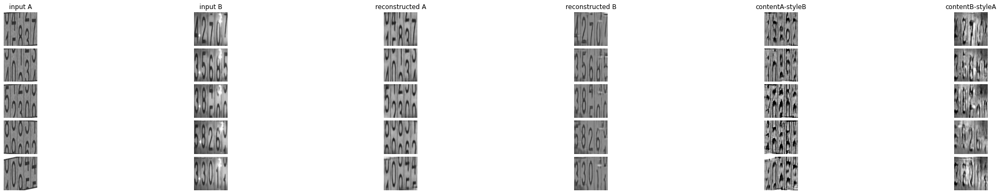

<Figure size 432x288 with 0 Axes>

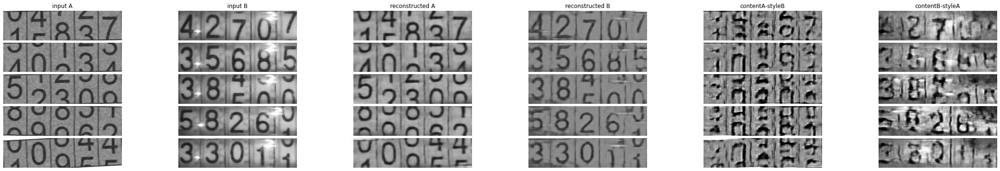

Training finished: 1257.984265 seconds


<Figure size 432x288 with 0 Axes>

In [11]:
# train munit model
model.train(train_A, train_B, epochs, test_A, test_B)

In [12]:
#model.sampleImages(images_synth_test, images_real_test, 12, show=True, save=True)

In [13]:
-----------

SyntaxError: invalid syntax (<ipython-input-13-492ee05286e7>, line 1)

In [ ]:
index_half = len(images_real) // 2
input_a = images_real[0:index_half]
input_b = images_real[index_half:None]

In [ ]:
loss = model.calc_gen_loss(input_a, input_b)

In [ ]:
x = [
    (1,2,3),
    (1,2,3),
    (1,2,3),
]
for x,y,z in x:
    print(x)
    print(y)
    print(z)
    print(z)

In [ ]:
x = ["a","b","c"]
y = [tf.keras.metrics.Mean(name) for name in x]
d = dict(zip(x,y))
print(d)

In [ ]:
x = 1
x = 2 if True else x

In [ ]:
model.disc_A.output_shape